<a href="https://colab.research.google.com/github/MAHI-hash0303/PCeSy/blob/main/Visualised_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd

In [ ]:
df=pd.read_csv("/content/patient_details.csv")

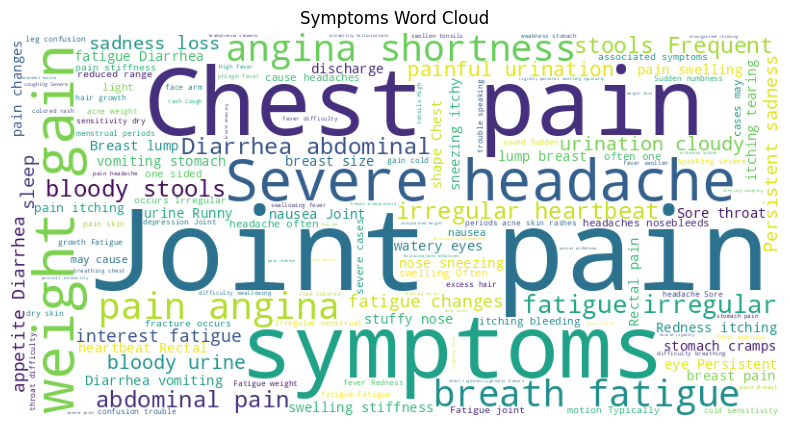

In [ ]:
from wordcloud import WordCloud

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(df['SYMPTOMS']))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.title("Symptoms Word Cloud")
plt.axis("off")
plt.show()

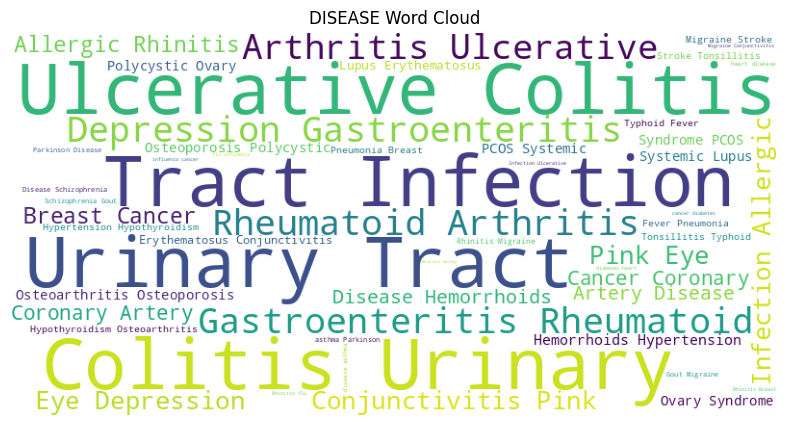

In [ ]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(df['DISEASE']))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.title("DISEASE Word Cloud")
plt.axis("off")
plt.show()

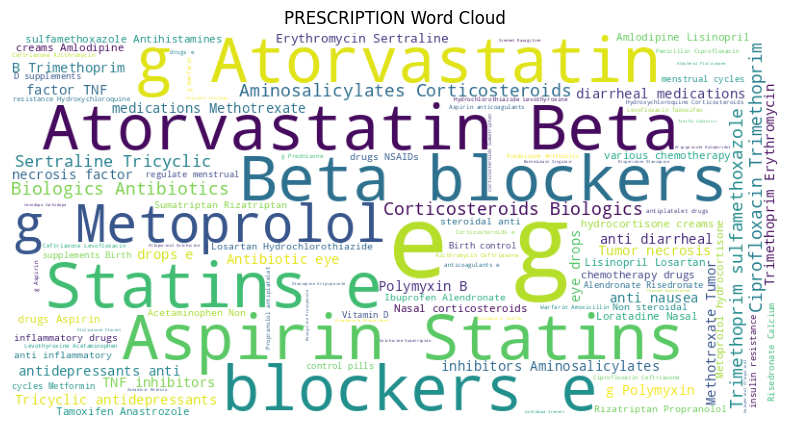

In [ ]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(df['PRESCRIPTION']))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud)
plt.title("PRESCRIPTION Word Cloud")
plt.axis("off")
plt.show()

In [ ]:
gender_counts = df['GENDER'].value_counts().reset_index()
gender_counts.columns=['GENDER','COUNT']
fig=px.bar(gender_counts,x='GENDER',y='COUNT', color='GENDER', labels={'COUNT': 'Count'})
fig.update_layout(title='Count of gender',xaxis_title='GENDER',yaxis_title='Count')
fig.show()

In [ ]:
disease_counts = df['DISEASE'].value_counts().reset_index()
disease_counts.columns = ['DISEASE', 'COUNT']
fig = px.bar(disease_counts, x='DISEASE', y='COUNT',color='DISEASE' ,labels={'COUNT': 'Count'})
fig.update_layout(title='Count of Each Disease',xaxis_title='Disease',yaxis_title='Count')
fig.show()

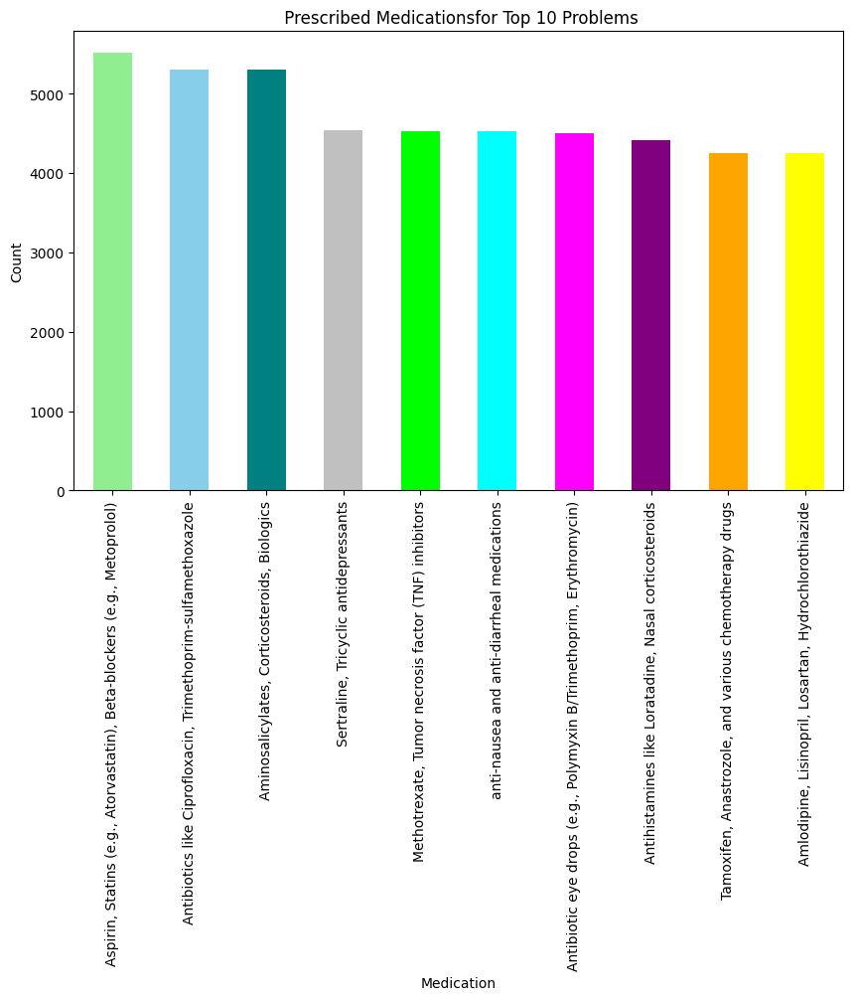

In [ ]:
prescription_counts = df['PRESCRIPTION'].value_counts().head(10)
plt.figure(figsize=(10, 6))
prescription_counts.plot(kind='bar', color=['lightgreen','skyblue','teal','silver','lime','cyan','magenta','purple','orange','yellow'])
plt.title(' Prescribed Medicationsfor Top 10 Problems')
plt.xlabel('Medication')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()


In [ ]:
color_mapping = {'Male': 'blue', 'Female': 'lightgreen'}
agg_df = df.groupby(['DISEASE', 'GENDER']).size().reset_index(name='COUNT')
fig = px.bar(agg_df, x='DISEASE', y='COUNT', color='GENDER', color_discrete_map=color_mapping, labels={'COUNT': 'Count'})
fig.update_layout(title='Gender Distribution by Disease',xaxis_title='Disease',yaxis_title='Count',barmode='group')
fig.show()


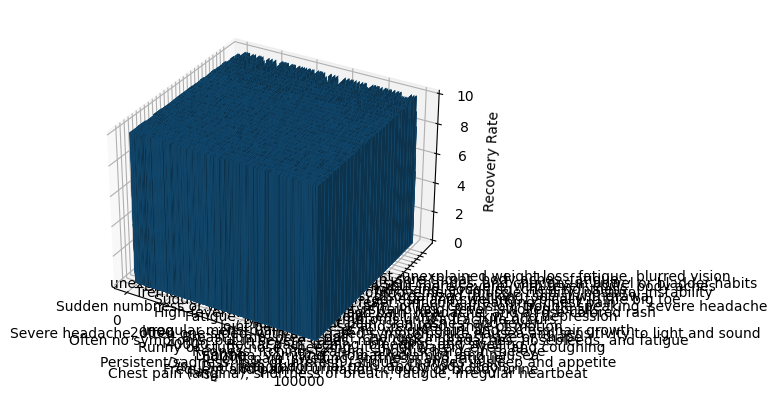

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
symptom_counts = df['SYMPTOMS'].value_counts()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = range(len(df))
y = [list(symptom_counts.index).index(symptom) for symptom in df['SYMPTOMS']]
z = np.zeros(len(df))
dx = dy = 1
dz = df['RECOVERY RATE']

ax.bar3d(x, y, z, dx, dy, dz, shade=True)

ax.set_xlabel('Disease')
ax.set_ylabel('Symptom')
ax.set_zlabel('Recovery Rate')

ax.set_yticks(range(len(symptom_counts)))
ax.set_yticklabels(symptom_counts.index)

plt.show()

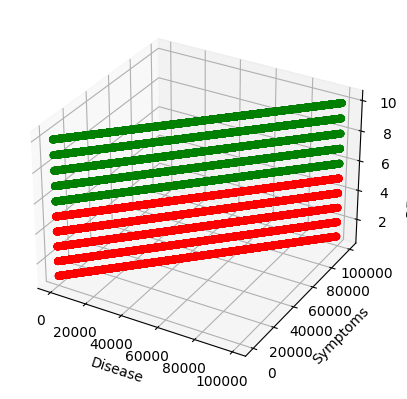

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x = range(len(df))
y = range(len(df))
z = df['RECOVERY RATE']
colors = np.where(z > 5, 'g', 'r')

ax.scatter(x, y, z, c=colors, marker='o')
ax.set_xlabel('Disease')
ax.set_ylabel('Symptoms')
ax.set_zlabel('RECOVERY RATE')

plt.show()

In [ ]:
import plotly.graph_objs as go
line_color = 'blue'
marker_color = 'red'

trace = go.Scatter3d(
    x=df['DISEASE'],
    y=df['SYMPTOMS'],
    z=df['RECOVERY RATE'],
    mode='lines+markers',
    text=df['DISEASE'],
    line=dict(color=line_color),
    marker=dict(color=marker_color)
)
layout = go.Layout(
    scene=dict(zaxis_title='RECOVERY RATE'),
    margin=dict(l=0, r=0, b=0, t=0)
)

fig = go.Figure(data=[trace], layout=layout)
fig.show()